In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.preprocessing import normalize
from sklearn.metrics import confusion_matrix
import plotly.graph_objects as go
from sklearn.manifold import TSNE
from sklearn.preprocessing import normalize
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.neighbors import KNeighborsClassifier, NearestCentroid
import time
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.neighbors import KNeighborsClassifier, NearestCentroid
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from sklearn.model_selection import RandomizedSearchCV
import numpy as np

In [ ]:
df=pd.read_csv("Desktop/dataset.csv",sep=',')
df.head()

In [10]:
df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [11]:
pd.DataFrame(df.isna().sum())

,0
id,0
diagnosis,0
radius_mean,0
texture_mean,0
perimeter_mean,0
area_mean,0
smoothness_mean,0
compactness_mean,0
concavity_mean,0
points_mean,0


In [12]:
B, M = df.diagnosis.value_counts()
print('Number of Benign: ',B)
print('Number of Malignant : ',M)
print('Percentage of Benign: ',B/(B+M)*100)
print('Number of Malignant : ',M/(B+M)*100)

Number of Benign:  357
Number of Malignant :  212
Percentage of Benign:  62.741652021089635
Number of Malignant :  37.258347978910365


<AxesSubplot:xlabel='diagnosis', ylabel='count'>

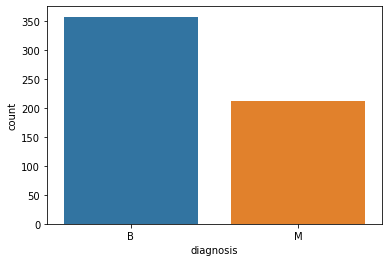

In [13]:
sns.countplot(df.diagnosis,label='count')

In [14]:
# Now converting lables into numeric form

In [15]:
encoder = LabelEncoder()
df.diagnosis = encoder.fit_transform(df.diagnosis)

In [16]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
0,87139402,0,12.32,12.39,78.85,464.1,0.10280,0.06981,0.03987,0.03700,...,13.50,15.64,86.97,549.1,0.1385,0.1266,0.12420,0.09391,0.2827,0.06771
1,8910251,0,10.60,18.95,69.28,346.4,0.09688,0.11470,0.06387,0.02642,...,11.88,22.94,78.28,424.8,0.1213,0.2515,0.19160,0.07926,0.2940,0.07587
2,905520,0,11.04,16.83,70.92,373.2,0.10770,0.07804,0.03046,0.02480,...,12.41,26.44,79.93,471.4,0.1369,0.1482,0.10670,0.07431,0.2998,0.07881
3,868871,0,11.28,13.39,73.00,384.8,0.11640,0.11360,0.04635,0.04796,...,11.92,15.77,76.53,434.0,0.1367,0.1822,0.08669,0.08611,0.2102,0.06784
4,9012568,0,15.19,13.21,97.65,711.8,0.07963,0.06934,0.03393,0.02657,...,16.20,15.73,104.50,819.1,0.1126,0.1737,0.13620,0.08178,0.2487,0.06766


<module 'matplotlib.pyplot' from 'C:\\Users\\adity\\Anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

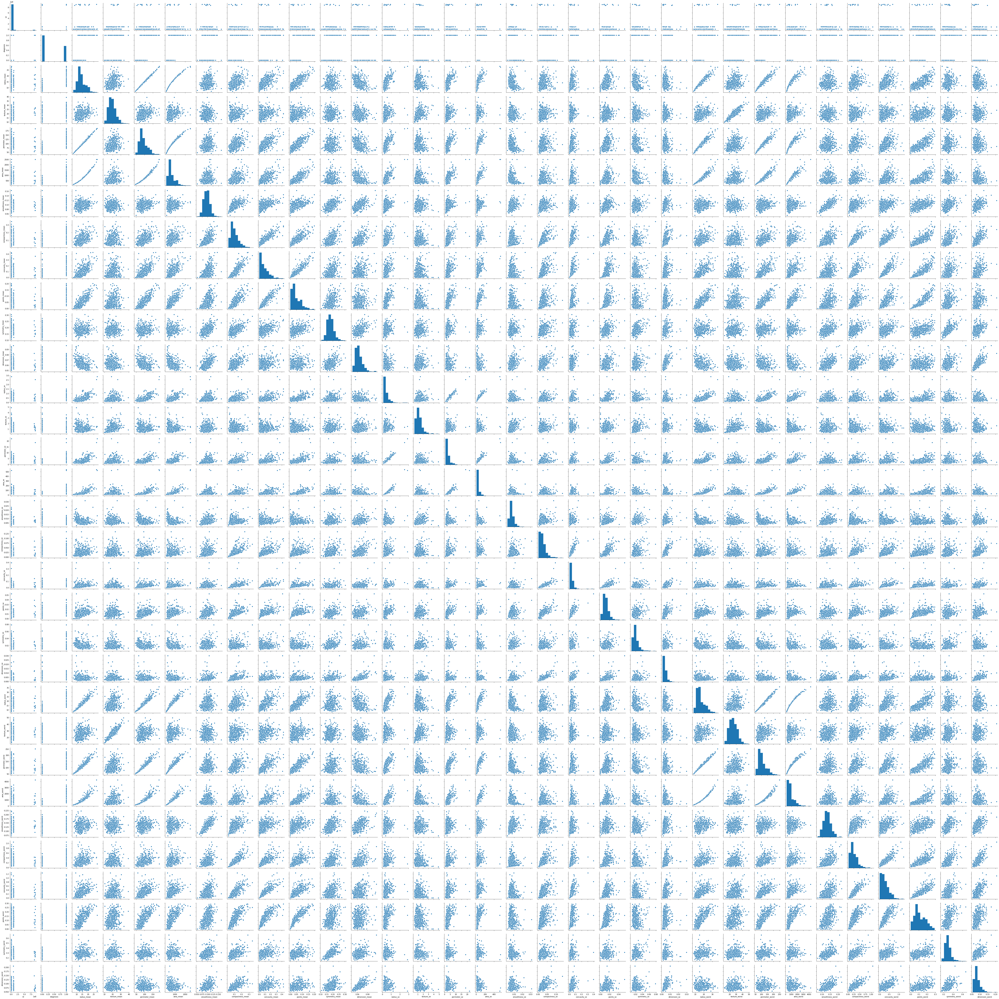

In [17]:
sns.pairplot(df,dropna=True)
plt

In [ ]:
# Correlation between all the variables at dataset

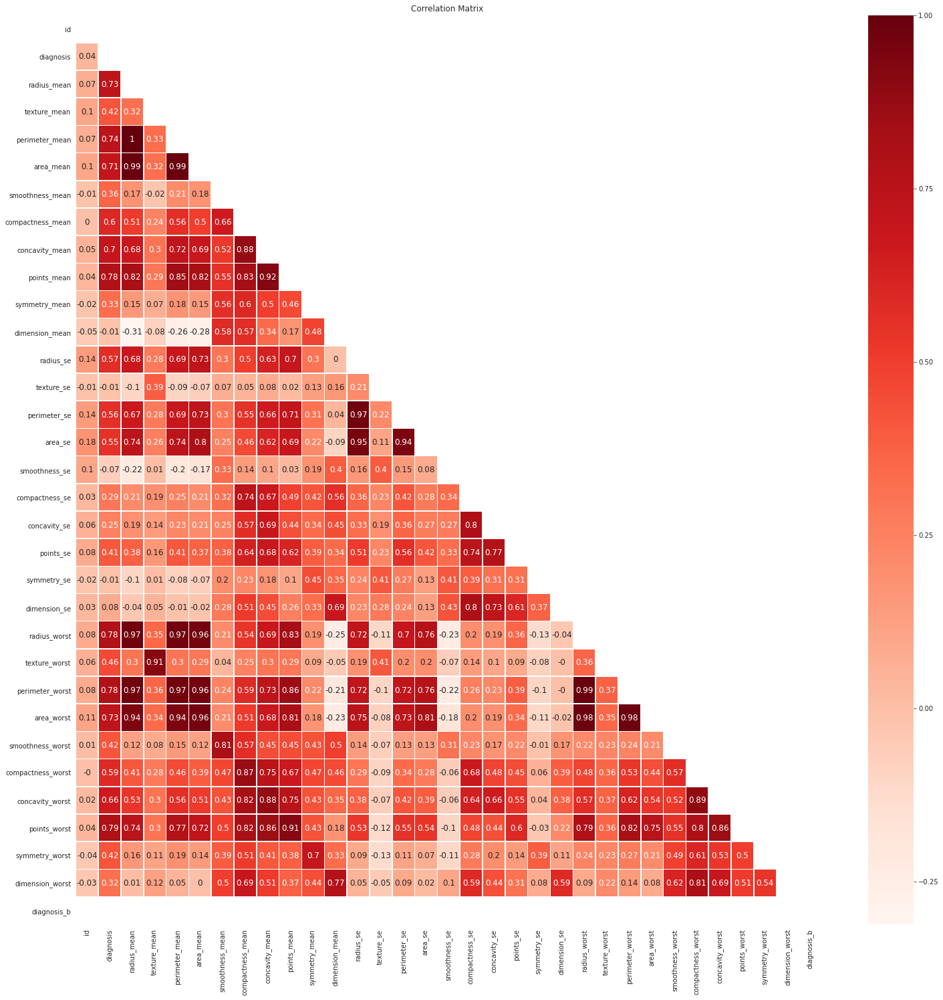

In [21]:
v = df
v["diagnosis_b"] = v.diagnosis.map({"M": 1.0, "B": 0.0})
v = v.corr()

with sns.axes_style("white"):
    mask = np.zeros_like(v)
    mask[np.triu_indices_from(mask)] = True
    plt.figure(figsize=(25, 25))
    sns.heatmap(
        round(v, 2),
        cmap="Reds",
        mask=mask,
        vmax=v.max().max(),
        vmin=v.min().min(),
        linewidths=0.5,
        annot=True,
        annot_kws={"size": 12},).set_title("Correlation Matrix ")


<module 'matplotlib.pyplot' from 'C:\\Users\\adity\\Anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

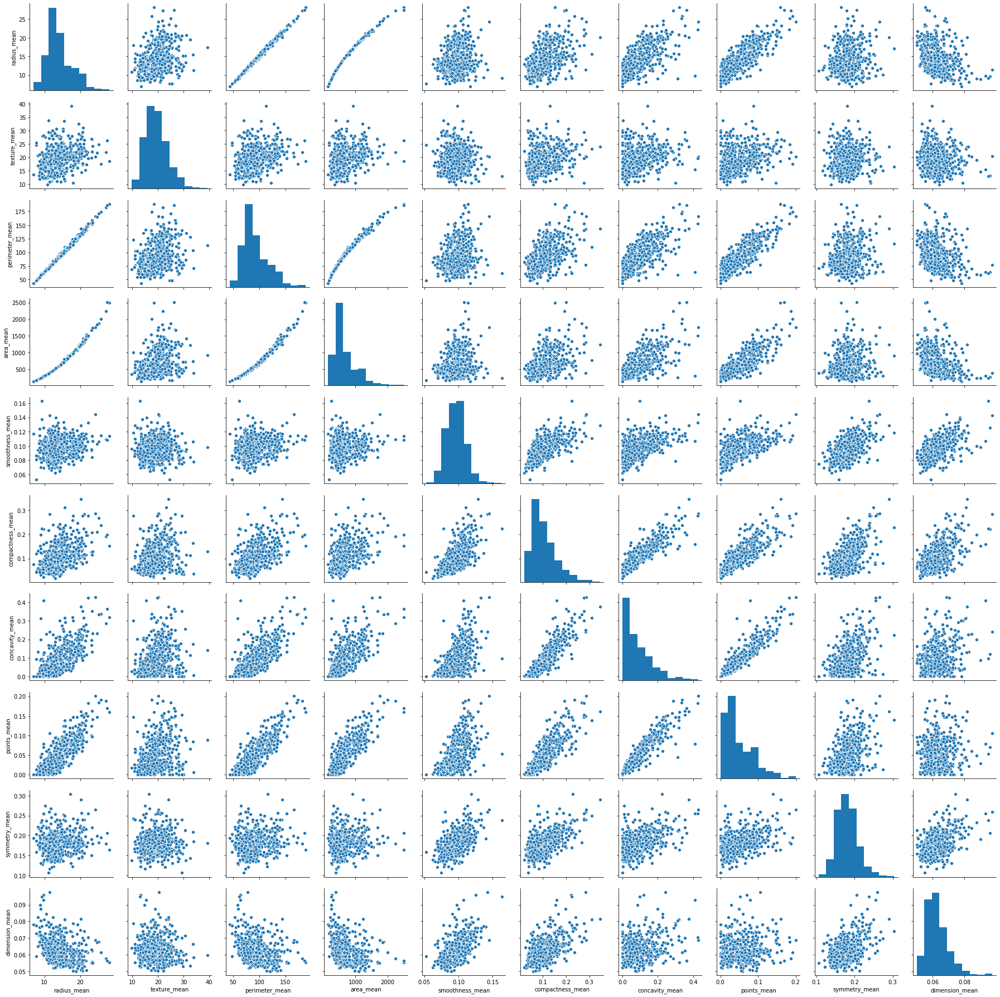

In [29]:
sns.pairplot(df,  vars=
['radius_mean',
'texture_mean',
'perimeter_mean',
'area_mean',
'smoothness_mean',
'compactness_mean',
'concavity_mean',
'points_mean',
'symmetry_mean',
'dimension_mean'])
plt

In [41]:
x = df.drop(["diagnosis", "diagnosis_b"], axis=1)
y = df.diagnosis.values

train_x, test_x, train_y, test_y = train_test_split(x, y)

In [42]:
from sklearn.dummy import DummyClassifier

dc = DummyClassifier(strategy="most_frequent")
dc.fit(train_x, train_y)
dc.score(test_x, test_y)

0.5804195804195804

In [43]:
from sklearn.ensemble import RandomForestClassifier
import random

SEED = 1234
random.seed(SEED)

rfc = RandomForestClassifier(n_estimators=100, max_depth=2, random_state=0)
rfc.fit(train_x, train_y)
rfc.score(test_x, test_y)

0.958041958041958

In [44]:
from sklearn.feature_selection import SelectKBest, chi2

SEED = 1234
random.seed(SEED)

select_k = SelectKBest(chi2, k=5)

select_k.fit(train_x, train_y)
train_x_k = select_k.transform(train_x)
test_x_k = select_k.transform(test_x)

rfck = RandomForestClassifier(n_estimators=100, max_depth=2, random_state=0)
rfck.fit(train_x_k, train_y)
rfck.score(test_x_k, test_y)


0.9230769230769231

In [45]:
from sklearn.feature_selection import RFE

SEED = 12345
random.seed(SEED)

rfc_aux = RandomForestClassifier(
    n_estimators=100, max_depth=2, random_state=0, n_jobs=-1
)
rfc_rfe = RFE(estimator=rfc_aux, n_features_to_select=5, step=1,)

rfc_rfe.fit(train_x, train_y)
train_x_rfe = rfc_rfe.transform(train_x)
test_x_rfe = rfc_rfe.transform(test_x)

rfc_aux.fit(train_x_rfe, train_y)
rfc_aux.score(test_x_rfe, test_y)

0.965034965034965

In [46]:
train_x.columns[rfc_rfe.support_]

Index(['points_mean', 'radius_worst', 'perimeter_worst', 'area_worst',
       'points_worst'],
      dtype='object')

In [47]:
from sklearn.feature_selection import RFECV

SEED = 12345
random.seed(SEED)

rfc_aux_cv = RandomForestClassifier(n_estimators=10, max_depth=2, random_state=0)
rfc_rfecv = RFECV(estimator=rfc_aux_cv, cv=10, step=1, scoring="accuracy", n_jobs=-1)

rfc_rfecv.fit(train_x, train_y)
train_x_rfecv = rfc_rfecv.transform(train_x)
test_x_rfecv = rfc_rfecv.transform(test_x)

rfc_aux_cv.fit(train_x_rfecv, train_y)
rfc_aux_cv.score(test_x_rfecv, test_y)

0.9440559440559441

In [48]:
train_x.columns[rfc_rfecv.support_]

Index(['area_mean', 'compactness_mean', 'concavity_mean', 'points_mean',
       'symmetry_mean', 'radius_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'points_worst'],
      dtype='object')

Inicial number of features:  30  with the acurracy:  0.9090909090909091


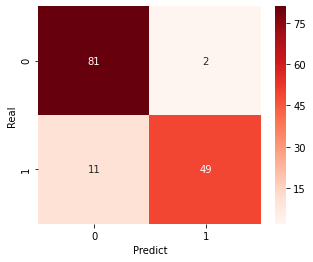

In [53]:
pca = PCA(n_components="mle")
pca_result = pca.fit(normalize(x, norm="max"))
train_x_pca = pca_result.transform(train_x)
test_x_pca = pca_result.transform(test_x)

pca_model = RandomForestClassifier(
    n_estimators=100, max_depth=2, random_state=0, n_jobs=-1
)
pca_model.fit(train_x_pca, train_y)


m_c = confusion_matrix(test_y, pca_model.predict(test_x_pca))
plt.figure(figsize=(5, 4))
sns.heatmap(m_c, annot=True, cmap="Reds", fmt="d").set(xlabel="Predict", ylabel="Real")
print(
    "Inicial number of features: ",
    test_x_pca.shape[1],
    " with the acurracy: ",
    pca_model.score(test_x_pca, test_y),
)

Inicial number of features:  31  with the acurracy:  0.958041958041958


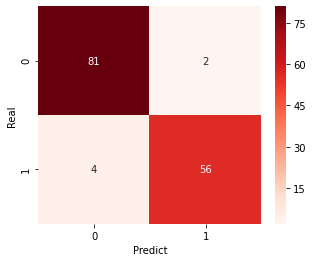

In [54]:
m_c = confusion_matrix(test_y, rfc.predict(test_x))
plt.figure(figsize=(5, 4))
sns.heatmap(m_c, annot=True, cmap="Reds", fmt="d").set(xlabel="Predict", ylabel="Real")
print(
    "Inicial number of features: ",
    train_x.shape[1],
    " with the acurracy: ",
    rfc.score(test_x, test_y),
)

RFE number of features:  5  with the acurracy:  0.965034965034965


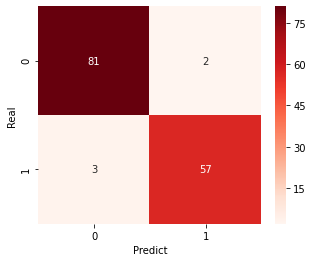

In [55]:
m_c_rfe = confusion_matrix(test_y, rfc_aux.predict(test_x_rfe))
plt.figure(figsize=(5, 4))
sns.heatmap(m_c_rfe, annot=True, cmap="Reds", fmt="d").set(
    xlabel="Predict", ylabel="Real"
)
print(
    "RFE number of features: ",
    train_x_rfe.shape[1],
    " with the acurracy: ",
    rfc_aux.score(test_x_rfe, test_y),
)

RFECV number of features:  14  with the acurracy:  0.9440559440559441


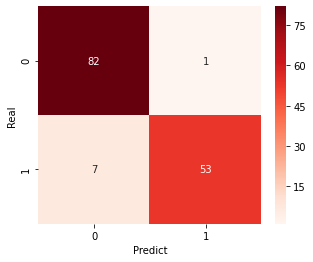

In [56]:
m_c_rfecv = confusion_matrix(test_y, rfc_aux_cv.predict(test_x_rfecv))
plt.figure(figsize=(5, 4))
sns.heatmap(m_c_rfecv, annot=True, cmap="Reds", fmt="d").set(
    xlabel="Predict", ylabel="Real"
)
print(
    "RFECV number of features: ",
    rfc_rfecv.n_features_,
    " with the acurracy: ",
    rfc_aux_cv.score(test_x_rfecv, test_y),
)

In [59]:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(normalize(x, norm="max"))
y_color = ["red" if el == "M" else "blue" for el in y]

fig = go.Figure(
    data=go.Scatter(
        x=pca_result[:, 0],
        y=pca_result[:, 1],
        mode="markers",
        marker={"color": y_color},
    )
)

fig.show()


In [62]:
tsne = TSNE(n_components=2)
tsne_result = tsne.fit_transform(normalize(x, norm="max"))

fig = go.Figure(
    data=go.Scatter(
        x=tsne_result[:, 0],
        y=tsne_result[:, 1],
        mode="markers",
        marker={"color": y_color},
    )
)

fig.show()

In [72]:
models = [
    ("SVC", SVC()),
    ("RandomForestClassifier", RandomForestClassifier()),
    ("SGDClassifier", SGDClassifier()),
    ("MLPClassifier", MLPClassifier()),
    ("DecisionTreeClassifier", DecisionTreeClassifier()),
    ("NearestCentroid", NearestCentroid()),
    ("KNeighborsClassifier", KNeighborsClassifier()),
]


def train_test_validation(model, name, X, Y):
    print(f"Starting {name}.")  # Debug
    ini = time.time()  # Start clock
    scores = cross_val_score(model, X, Y, cv=4)  # Cross-validation
    fim = time.time()  # Finish clock
    print(f"Finish {name}.")  # Debug
    return (name, scores.mean(), scores.max(), scores.min(), fim - ini)

In [74]:
%%time
results = [ train_test_validation(model[1], model[0], x, y) for model in models ] 
results = pd.DataFrame(results, columns=['Classifier', 'Mean', 'Max', 'Min', 'TimeSpend (s)']) 

Starting SVC.
Finish SVC.
Starting RandomForestClassifier.


C:\Users\adity\Anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.

C:\Users\adity\Anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.

C:\Users\adity\Anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.

C:\Users\adity\Anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled 

Finish RandomForestClassifier.
Starting SGDClassifier.
Finish SGDClassifier.
Starting MLPClassifier.


C:\Users\adity\Anaconda3\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:566: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\adity\Anaconda3\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:566: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

C:\Users\adity\Anaconda3\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:566: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



Finish MLPClassifier.
Starting DecisionTreeClassifier.
Finish DecisionTreeClassifier.
Starting NearestCentroid.
Finish NearestCentroid.
Starting KNeighborsClassifier.
Finish KNeighborsClassifier.
Wall time: 2.65 s


C:\Users\adity\Anaconda3\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:566: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



In [76]:
fig = make_subplots(rows=2, cols=1, shared_yaxes=True)
x_plot = results["Classifier"]
y_plot = round(results["Mean"] * 100, 2)
z_plot = round(results["TimeSpend (s)"], 2)

fig.add_trace(go.Bar(x=x_plot, y=y_plot, text=y_plot, textposition="auto"), 1, 1)
fig.add_trace(go.Bar(x=x_plot, y=z_plot, text=z_plot, textposition="auto"), 2, 1)

fig.update_layout(height=800, width=1000, title_text="Traing Models Results")
fig.update_xaxes(title_text="Acurracy by Crossvalidation", row=1, col=1)
fig.update_xaxes(title_text="Time Spended by traing", row=2, col=1)
fig.update_yaxes(title_text="Accurracy in percent (%)", row=1, col=1)
fig.update_yaxes(title_text="Time in seconds (s)", row=2, col=1)


fig.show()